<a href="https://colab.research.google.com/github/k6jf8wfhxh-ux/Iris_classification/blob/main/lecture12_Gym_exercise_answer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 第12回講義 演習
今回は，様々な強化学習アルゴリズムを実装して学習させてみます．

---

# Lecture 12: Exercises
In this exercise, we will implement and train a variety of reinforcement learning algorithms.


## 目次
[【課題】様々な強化学習アルゴリズムの実装](#scrollTo=5YJ_APz_8uLn)

1. [Gymによる環境の構築](#scrollTo=zKEUYodQ8uLr)
2. [Q学習アルゴリズム](#scrollTo=Aa-_RFlZ8uLw)
3. [DQNアルゴリズム](#scrollTo=vM7bGYBS8uL6)
4. [方策勾配法](#scrollTo=LIDOvGdcGKq4)

 4.1. [REINFORCEアルゴリズム](#scrollTo=JReB3RKbU2JV)

 4.2. [Actor-Critic法とDDPG](#scrollTo=NVp-Cau8UwaK)

---

## Table of Contents
[[Task] Implementing various reinforcement learning algorithms](#scrollTo=5YJ_APz_8uLn)

1. [Building an environment with Gym](#scrollTo=zKEUYodQ8uLr)
2. [Q-learning](#scrollTo=Aa-_RFlZ8uLw)
3. [DQN](#scrollTo=vM7bGYBS8uL6)
4. [Policy gradient methods](#scrollTo=LIDOvGdcGKq4)

 4.1. [REINFORCE](#scrollTo=JReB3RKbU2JV)

 4.2. [Actor–Critic and DDPG](#scrollTo=NVp-Cau8UwaK)


## 【課題】様々な強化学習アルゴリズムの実装

**今回の講義の演習に関する注意事項**

実行時にメモリをたくさん使用するので，colabだと途中で実行が止まってしまうことがあります．

その場合は，ランタイムを再起動して，以下の3つのセルを実行してから目的のセルを再実行してください．

---

## [Task] Implementing Various Reinforcement Learning Algorithms

**Notes for this exercise**

This notebook can consume a lot of memory during execution, so the runtime may stop partway through on Colab.

If that happens, restart the runtime, run the following three cells, and then re-run the cell you want.


In [ ]:
# Run the following on Colab
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!apt-get install xvfb
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!pip install JSAnimation
!pip install xvfbwrapper
!pip install numpy==1.23.5  # Pin the NumPy version to avoid incompatibilities with gym

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.16).
0 upgraded, 0 newly installed, 0 to remove and 53 not upgraded.
  Preparing metadata (setup.py) ... done
  Created wheel for JSAnimation: filename=JSAnimation-0.1-py3-none-any.whl size=11407 sha256=f0aaa827c49cad4b6e1f9268caed20fda2f059a7d723e755930539ca1797b026
  Stored in directory: /root/.cache/pip/wheels/2d/6e/2e/c0e2a000cd36fbb86a92b6e7f0042a195ca3a080898a928f9f
Successfully built JSAnimation
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 91.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exite

In [ ]:
# Run the following on Colab
from pyvirtualdisplay import Display
pydisplay = Display(visible=0, size=(400, 300))
pydisplay.start()

In [ ]:
import numpy as np
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_
import copy
from collections import deque
import gym
from gym import wrappers
import pygame
f = pygame.transform.smoothscale; pygame.transform.smoothscale = lambda s, size, *a, **k: f(s, (int(size[0]), int(size[1])), *a, **k)
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Categorical, Normal
import matplotlib
import matplotlib.animation as animation
import matplotlib.pyplot as plt

from IPython import display
from JSAnimation.IPython_display import display_animation
from IPython.display import HTML

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/pygame/pkgdata.py:25: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import resource_stream, resource_exists
/usr/local/lib/python3.12/dist-packages/pkg_resources/__init__.py:3154: De

## 1.Gymによる環境の構築

逐次意思決定問題はエージェントが環境中で逐次的に意思決定をする問題設定です．
このノートブックでは[OpenAI Gym](https://www.gymlibrary.dev/index.html)を用いて環境を作成し，逐次意思決定問題の流れを実装します．


今回は，CartPole-v0と呼ばれる，台車に振子がついた環境を利用します（[詳細](https://github.com/openai/gym/wiki/CartPole-v0)）．

  - 状態空間：4つの連続値
      1. カートの座標
      1. カートの速度
      1. ポールの角度
      1. ポールの角速度
  - 行動空間：1つの離散値
    - 左に押す(0) または 右に押す(1)
  - 以下の終端条件のいずれかを満たすとエピソードが終了します．
    - 棒の角度が±12°より傾いたとき
    - 台車の位置が±2.4の範囲を逸脱したとき
    - エピソードの長さが200ステップに達したとき
  - 報酬：エピソードが終了するまで常に+1. 今回は学習を簡単にするため，ポールが倒れると-10の報酬が発生するように変更します．このように報酬を変える工夫はreward shapingと呼ばれます．

---

## 1. Building an Environment with Gym

A sequential decision-making problem is a setting where an agent repeatedly makes decisions in an environment.
In this notebook, we will use [OpenAI Gym](https://www.gymlibrary.dev/index.html) to create an environment and implement the basic loop of a sequential decision-making problem.

Here we use the environment called CartPole-v0, where a pole is attached to a cart ([details](https://github.com/openai/gym/wiki/CartPole-v0)).

  - State space: 4 continuous values
      1. Cart position
      1. Cart velocity
      1. Pole angle
      1. Pole angular velocity
  - Action space: 1 discrete value
    - Push left (0) or push right (1)
  - An episode ends if any of the following terminal conditions is met:
    - The pole angle tilts beyond ±12°
    - The cart position goes outside the range ±2.4
    - The episode length reaches 200 steps
  - Reward: +1 at every step until the episode ends. To make learning easier in this exercise, we modify the reward so that a reward of -10 is given when the pole falls. Such a modification of rewards is called *reward shaping*.


環境を作成してランダムな行動を取ってみましょう．  

Let's create the environment and take random actions.


In [ ]:
env = gym.make('CartPole-v0')  # Create the simulator environment
frames = []
for episode in range(5):
    state = env.reset()  # Start an episode (reset the environment)
    env.render()  # Render the simulator screen
    screen = env.render(mode='rgb_array')  # For visualising in the notebook
    frames.append(screen)
    done = False
    while not done:
        action = env.action_space.sample()  # Sample a random action
        next_state, reward, done, _ = env.step(action)  # Take the action and get next state, reward, and done flag
        env.render()
        screen = env.render(mode='rgb_array')
        frames.append(screen)
env.close()  # Close the rendering

/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/core.py:49: DeprecationWarning: WARN: You are calling render method, but you didn't specified the argument render_mode at environment initialization. To mainta

以下のセルを実行すると，notebook上で結果が可視化できます．  

Running the following cell will visualise the result in the notebook.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


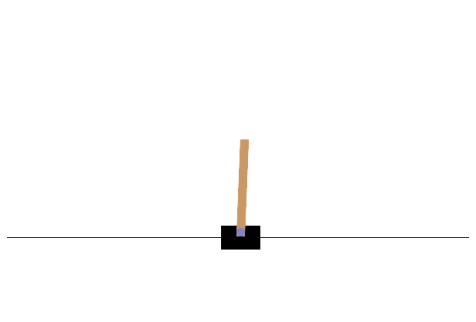

In [ ]:
# Check the result
plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(anim.to_jshtml())

**やってみよう！（余力のある人向けの追加課題）**

OpenAI GymにはCartPoleの他にも様々なシミュレータ・ゲーム環境が用意されています．それらの環境をインポートして，ランダムな行動をとったときの結果を可視化してみましょう．

環境の一覧はOpenAI Gymの[webサイト](https://gym.openai.com/envs/)や[Github wiki](https://github.com/openai/gym/wiki/Table-of-environments)に掲載されています．

ライブラリを追加でインストールすることが必要な環境がありますが，今回その詳細については扱いません．

---

**Try it! (Optional extra task for those with time)**

OpenAI Gym provides many simulator/game environments in addition to CartPole. Import one of them and visualise the outcome when you take random actions.

A list of environments is available on the OpenAI Gym [website](https://gym.openai.com/envs/) and the [GitHub wiki](https://github.com/openai/gym/wiki/Table-of-environments).

Some environments require installing additional libraries, but we will not cover those details here.


In [ ]:
# LET'S TRY

## 2.Q学習アルゴリズム

Gymを使った逐次意思決定問題にQ学習を実装しましょう．
Q学習は以下の更新を繰り返します．
$$Q(s^{(h)},a^{(h)}) \leftarrow (1-\alpha) Q(s^{(h)},a^{(h)})+ \alpha \left(r^{(h)}+\gamma \max_{a'}Q(s^{(h+1)},a')\right)$$

ここで，$\alpha$は学習率，$\gamma$は割引率です．また，以下の実装では**ε-貪欲方策**を利用します．小さい確率$\epsilon$で一様な確率でランダムな行動を選択し，それ以外はQ値が最も高い行動を選択します．

これからCartPoleにQ学習を実装するわけですが，CartPoleの状態空間は無限集合になり得ます（ポールの角度などは連続値です）．
講義で学んだQ学習は状態行動空間が有限なマルコフ決定過程に対するアルゴリズムなので，このままでは実装できません．
そこで，状態空間を適当な間隔で離散化し，無限の状態空間を有限集合で近似しましょう．ここでは，状態空間の各次元を6分割して， $6^4\times2=2692$個の値を持つ行列としてQ関数を表現します．

---

## 2. Q-learning

Let’s implement Q-learning for a sequential decision-making problem using Gym.
Q-learning repeatedly applies the following update:
$$Q(s^{(h)},a^{(h)}) \leftarrow (1-\alpha) Q(s^{(h)},a^{(h)})+ \alpha \left(r^{(h)}+\gamma \max_{a'}Q(s^{(h+1)},a')\right)$$

Here, $\alpha$ is the learning rate and $\gamma$ is the discount factor. In the implementation below, we use an **ε-greedy policy**: with a small probability $\epsilon$ we choose a random action uniformly, otherwise we choose the action with the highest Q-value.

We will implement Q-learning for CartPole, but CartPole’s state space can be infinite (e.g., the pole angle is continuous).
The Q-learning you learned in the lecture assumes a finite state–action space, so we cannot apply it directly as-is.
To handle this, we discretise the state space with a fixed interval and approximate the infinite state space with a finite set. Here, we split each state dimension into 6 bins and represent the Q-function as a table with $6^4\times2=2692$ entries.


まずは，そのために便利な関数を作っておきましょう．  

First, let’s prepare some helper functions for this discretisation.


In [ ]:
def bins(clip_min, clip_max, num):
    return np.linspace(clip_min, clip_max, num+1)[1:-1]

# Discretise the state and return the corresponding index (bin bounds are specific to CartPole)
def discretize_state(observation, num_discretize):
    c_pos, c_v, p_angle, p_v = observation
    discretized = [
        np.digitize(c_pos, bins=bins(-2.4, 2.4, num_discretize)),
        np.digitize(c_v, bins=bins(-3.0, 3.0, num_discretize)),
        np.digitize(p_angle, bins=bins(-0.5, 0.5, num_discretize)),
        np.digitize(p_v, bins=bins(-2.0, 2.0, num_discretize))
    ]
    return sum([x*(num_discretize**i) for i, x in enumerate(discretized)])

Q学習を実装します．  

Now, let’s implement Q-learning.


In [ ]:
class QLearning:
    def __init__(self, num_state, num_action, num_discretize, gamma=0.99, alpha=0.5):
        self.num_action = num_action
        self.gamma = gamma  # Discount factor
        self.alpha = alpha  # Learning rate
        # Create the Q-table
        self.qtable = np.zeros((num_discretize**num_state, num_action))

    # Update the Q-table
    def update_qtable(self, state, action, reward, next_state):
        self.qtable[state, action] = (1 - self.alpha) *  self.qtable[state, action] + self.alpha* (reward + self.gamma * self.qtable[next_state].max())

    # Choose the action with the maximum Q-value (greedy policy)
    def get_greedy_action(self, state):
        action = np.argmax(self.qtable[state])
        return action

    # ε-greedy policy
    def get_action(self, state, episode):
        epsilon = 0.7 * (1/(episode+1))  # Here we use a decaying ε (starts around 0.7)
        if epsilon <= np.random.uniform(0,1):
            action = self.get_greedy_action(state)
        else:
            action = np.random.choice(self.num_action)
        return action

/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Episode 0 finished | Episode reward 8.000000
Episode 50 finished | Episode reward 91.000000
Episode 100 finished | Episode reward 105.000000
Episode 150 finished | Episode reward 47.000000
Episode 200 finished | Episode reward 200.000000
Episode 250 finished | Episode reward 170.000000
Episode 300 finished | Episode reward 161.000000
Episode 350 finished | Episode reward 118.000000
Episode 400 finished | Episode reward 136.000000
Episode 450 finished | Episode reward 153.000000
Episode 500 finished | Episode reward 200.000000
Episode 550 finished | Episode reward 187.000000
Episode 600 finished | Episode reward 200.000000
Episode 650 finished | Episode reward 200.000000
Episode 700 finished | Episode reward 167.000000
Episode 750 finished | Episode reward 200.000000
Episode 800 finished | Episode reward 141.000000
Episode 850 finished | Episode reward 200.000000
Episode 900 finished | Episode reward 139.000000
Episode 950 finished | Episode reward 149.000000
Episode 1000 finished | Epi

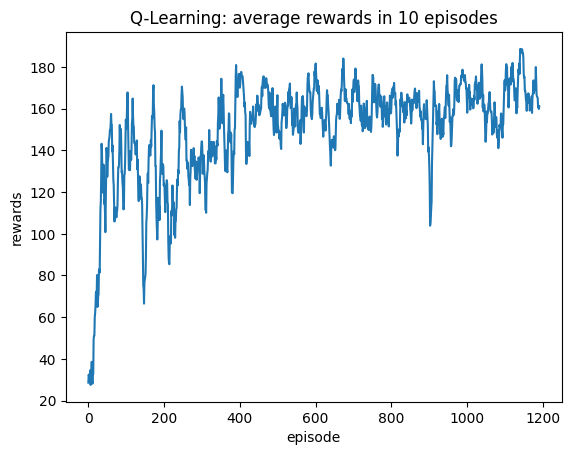

In [ ]:
# Hyperparameters
num_episode =1200  # Number of training episodes
num_discretize = 6  # Number of bins for state discretisation
penalty = 10  # Penalty when an episode terminates early

# Logs
episode_rewards = []
num_average_epidodes = 10

env = gym.make('CartPole-v0')
max_steps = env.spec.max_episode_steps  # Max steps per episode

agent = QLearning(env.observation_space.shape[0], env.action_space.n, num_discretize)

for episode in range(num_episode):
    observation = env.reset()  # The environment returns a 4D continuous observation
    state = discretize_state(observation, num_discretize)  # Discretise the observation (get the state index)
    episode_reward = 0
    for t in range(max_steps):
        action = agent.get_action(state, episode)  # Select an action
        observation, reward, done, _ = env.step(action)
        # Add a penalty if the episode ends early
        if done and t < max_steps - 1:
            reward = - penalty
        episode_reward += reward
        next_state = discretize_state(observation, num_discretize)
        agent.update_qtable(state, action, reward, next_state)  # Update the Q-value table
        state = next_state
        if done:
            break
    episode_rewards.append(episode_reward)
    if episode % 50 == 0:
        print("Episode %d finished | Episode reward %f" % (episode, episode_reward))

# Plot the moving average of cumulative reward
moving_average = np.convolve(episode_rewards, np.ones(num_average_epidodes)/num_average_epidodes, mode='valid')
plt.plot(np.arange(len(moving_average)),moving_average)
plt.title('Q-Learning: average rewards in %d episodes' % num_average_epidodes)
plt.xlabel('episode')
plt.ylabel('rewards')
plt.show()

env.close()

エピソードごとに得られた合計報酬が改善していき，方策が学習できていることがわかります．

**注意**：初期値などの設定より，学習が非常に不安定になる場合があります．

それでは，得られた方策をテストして結果の動画を表示してみましょう．

ランダムな行動を選択したときよりも，長い間立て続けられていると思います．

---

You should see that the total reward per episode improves over time, indicating that the policy is being learned.

**Note:** Depending on settings such as initial values, learning can be very unstable.

Now, let’s test the learned policy and display the resulting video.

Compared to taking random actions, the pole should stay upright for longer.


/usr/local/lib/python3.12/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


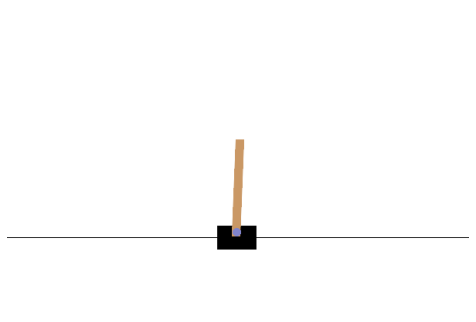

In [ ]:
# Test the final policy (visualisation)
env = gym.make('CartPole-v0')
frames = []
for episode in range(3):
    observation = env.reset()
    state = discretize_state(observation, num_discretize)
    frames.append(env.render(mode='rgb_array'))
    done = False
    while not done:
        action = agent.get_greedy_action(state)
        next_observation, reward, done, _ = env.step(action)
        frames.append(env.render(mode='rgb_array'))
        state = discretize_state(next_observation, num_discretize)
env.close()

plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(anim.to_jshtml())

**やってみよう！（余力のある人向けの追加課題）**

上記のプログラムには複数のハイパーパラメータがあります．それらを変化させて，学習曲線がどのように変化するかを観察してみましょう．

ハイパーパラメータの例：
- `num_discretize`：離散化する数
- `gamma`：割引率
- `alpha`：学習率
- `penalty`：途中で学習が終了したときのペナルティの大きさ
- `epsilon`：ε-貪欲方策でのεの関数（例えば，定数にしてみる，線形に減衰させてみる，など）
- `num_episode`：学習エピソード数

---

**Try it! (Optional extra task for those with time)**

The program above has several hyperparameters. Change them and observe how the learning curve changes.

Examples of hyperparameters:
- `num_discretize`: number of bins for discretisation
- `gamma`: discount factor
- `alpha`: learning rate
- `penalty`: penalty magnitude when the episode terminates early
- `epsilon`: the ε schedule for ε-greedy (e.g., constant, linearly decaying, etc.)
- `num_episode`: number of training episodes


In [ ]:
# LET'S TRY

## 3.DQNアルゴリズム
これまでは，連続値の状態空間を持つ問題に対して，状態空間を離散化することで価値関数をテーブル形式で表現していました．

ここでは，ニューラルネットワークを用いて価値関数を表現することを考えます．状態空間の離散化を行わず，連続値のまま扱うことができます．

DQN（Deep Q-Network）は，Q関数をNNによって表現した手法です．Q学習はベルマン誤差
$$
(s^{(h)}, a^{(h)})でのベルマン誤差=r^{(h)}+\gamma \max_{a'}Q(s^{(h+1)},a') - Q(s^{(h)},a^{(h)})
$$
を小さくするように学習するアルゴリズムでした．
DQNはこのNN版です．次のように，ミニバッチ$\mathscr{D}$を使ったベルマン誤差の最小化を繰り返します．

$$
\mathbb{E}_\mathscr{D} \left[\left(r+\gamma \max_{a'}Q_{\bar{\theta}}(s',a')- Q_\theta(s,a)\right)^2 \right]
$$


**工夫**
- **ターゲットネットワーク**（target Q-network）の利用
  - $\mathbb{E}_\mathscr{D} \left[\left(r+\gamma \max_{a'}Q_{\theta}(s',a')- Q_\theta(s,a)\right)^2 \right]$のように正解ラベルの値で$Q_\theta$を使うと，
 正解ラベルの値が$\theta$を更新するために変化し，学習が不安定になります．
  - これを避けるために，$Q_\theta$の重みがコピーした固定されたターゲットネットワーク$Q_{\bar{\theta}}$を用意し，このターゲットネットワークをラベルに利用します．ターゲットネットワークの重みは適当な更新回数ごとに$Q_\theta$の重みをコピーすることで更新します．
- **経験リプレイ**（experience replay）の利用
  - **リプレイバッファ**（replay buffer）にこれまでの状態遷移を記録しておき，そこからサンプルすることでミニバッチを作ります．

**論文**
- [Human-level control through deep reinforcement learning （Nature版）](https://www.nature.com/articles/nature14236)
- [Playing Atari with Deep Reinforcement Learning （NIPS2013 workshop版）](https://arxiv.org/abs/1312.5602)

**補足説明**

深層強化学習には様々な実装の仕方がありますが，今回の講義では以下のモジュールに分けて実装しています．
  
- 1つ目のセル：関数表現のためのニューラルネットワーク（とリプレイバッファ）
- 2つ目のセル：エージェントの定義
- 3つ目のセル：実際に環境と相互作用して学習を実行する部分
- (4つ目のセル：学習したエージェントの結果の可視化）

---

## 3. DQN

So far, for problems with continuous state spaces, we discretised the states and represented the value function as a table.

Here, we will represent the value function using a neural network. This lets us handle states as continuous values without discretisation.  



DQN (Deep Q-Network) represents the Q-function with a neural network. Q-learning learns by reducing the Bellman error:
$$
\text{Bellman error at }(s^{(h)}, a^{(h)}) = r^{(h)}+\gamma \max_{a'}Q(s^{(h+1)},a') - Q(s^{(h)},a^{(h)})
$$
DQN is the neural-network version of this idea. It repeatedly minimises the (squared) Bellman error over a mini-batch $\mathscr{D}$:

$$
\mathbb{E}_\mathscr{D} \left[\left(r+\gamma \max_{a'}Q_{\bar{\theta}}(s',a')- Q_\theta(s,a)\right)^2 \right]
$$

**Key techniques**
- **Target network** (target Q-network)
  - If we use $Q_\theta$ on the target side, e.g.
    $\mathbb{E}_\mathscr{D} \left[\left(r+\gamma \max_{a'}Q_{\theta}(s',a')- Q_\theta(s,a)\right)^2 \right]$,
    the target value changes as $\theta$ is updated, which can make learning unstable.
  - To avoid this, we maintain a separate, fixed target network $Q_{\bar{\theta}}$ whose weights are copied from $Q_\theta$ every certain number of updates, and we use $Q_{\bar{\theta}}$ to compute the target.
- **Experience replay**
  - We store past transitions in a **replay buffer** and sample from it to form mini-batches.

**Papers**
- [Human-level control through deep reinforcement learning (Nature)](https://www.nature.com/articles/nature14236)
- [Playing Atari with Deep Reinforcement Learning (NIPS 2013 workshop)](https://arxiv.org/abs/1312.5602)

**Supplement**

There are many ways to implement deep RL, but in this lecture we split the implementation into the following modules:

- Cell 1: the neural network for function approximation (and the replay buffer)
- Cell 2: the agent definition
- Cell 3: the training loop that interacts with the environment
- (Cell 4: visualisation of the trained agent’s behaviour)


In [ ]:
# Define the Q-function
class QNetwork(nn.Module):
    def __init__(self, dim_state, num_action, hidden_size=16):
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(dim_state, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, num_action)

    def forward(self, x):
        h = F.elu(self.fc1(x))
        h = F.elu(self.fc2(h))
        h = F.elu(self.fc3(h))
        y = F.elu(self.fc4(h))
        return y

# Define the replay buffer
class ReplayBuffer:
    def __init__(self, memory_size):
        self.memory_size = memory_size
        self.memory = deque([], maxlen = memory_size)

    def append(self, transition):
        self.memory.append(transition)

    def sample(self, batch_size):
        batch_indexes = np.random.randint(0, len(self.memory), size=batch_size)
        states      = np.array([self.memory[index]['state'] for index in batch_indexes])
        next_states = np.array([self.memory[index]['next_state'] for index in batch_indexes])
        rewards     = np.array([self.memory[index]['reward'] for index in batch_indexes])
        actions     = np.array([self.memory[index]['action'] for index in batch_indexes])
        dones   = np.array([self.memory[index]['done'] for index in batch_indexes])
        return {'states': states, 'next_states': next_states, 'rewards': rewards, 'actions': actions, 'dones': dones}

In [ ]:
class Dqn:
    def __init__(self, dim_state, num_action, gamma=0.99, lr=0.001, batch_size=32, memory_size=50000, target_update_freq=30):
        self.dim_state = dim_state
        self.num_action = num_action
        self.gamma = gamma  # Discount factor
        self.batch_size = batch_size  # Number of transitions used per Q update
        self.target_update_freq = target_update_freq  # Frequency to update the target network
        self.qnet = QNetwork(dim_state, num_action)
        self.target_qnet = QNetwork(dim_state, num_action)  # Target network
        self.optimizer = optim.Adam(self.qnet.parameters(), lr=lr)
        self.replay_buffer = ReplayBuffer(memory_size)
        self._target_qnet_update_count = 0

    # Update the Q-function
    def update_q(self):
        batch = self.replay_buffer.sample(self.batch_size)
        q = self.qnet(torch.tensor(batch["states"], dtype=torch.float)).gather(1, torch.tensor(batch["actions"]).reshape(-1, 1))  # Extract Q-values corresponding to the actions in the batch

        with torch.no_grad():
          # Compute max Q
          maxq = torch.max(self.target_qnet(torch.tensor(batch["next_states"],dtype=torch.float)), dim=1).values
          target = torch.tensor(batch["rewards"], dtype=torch.float) + self.gamma * maxq * torch.tensor(~batch["dones"], dtype=torch.bool) # WRITE ME

        self.optimizer.zero_grad()
        # Use MSE as the loss
        loss = nn.MSELoss()(q, target)
        loss.backward()
        self.optimizer.step()

        self._target_qnet_update_count += 1
        if self._target_qnet_update_count % self.target_update_freq == 0:  # Update the target network every fixed number of updates
          self.target_qnet.load_state_dict(self.qnet.state_dict())

    # Choose the action with the maximum Q-value (greedy policy)
    def get_greedy_action(self, state):
        state_tensor = torch.tensor(state, dtype=torch.float).view(-1, self.dim_state)
        action = torch.argmax(self.qnet(state_tensor).data).item()
        return action

    # ε-greedy policy
    def get_action(self, state, episode):
        epsilon = 0.7 * (1/(episode+1))  # Here we use a decaying ε (starts around 0.7)
        if epsilon <= np.random.uniform(0,1):
            action = self.get_greedy_action(state)
        else:
            action = np.random.choice(self.num_action)
        return action

/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/loss.py:626: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead 

Episode 0 finished | Episode reward 17.000000
Episode 20 finished | Episode reward 10.000000
Episode 40 finished | Episode reward 11.000000
Episode 60 finished | Episode reward 8.000000
Episode 80 finished | Episode reward 9.000000
Episode 100 finished | Episode reward 9.000000
Episode 120 finished | Episode reward 8.000000
Episode 140 finished | Episode reward 10.000000
Episode 160 finished | Episode reward 9.000000
Episode 180 finished | Episode reward 9.000000
Episode 200 finished | Episode reward 15.000000
Episode 220 finished | Episode reward 11.000000
Episode 240 finished | Episode reward 9.000000
Episode 260 finished | Episode reward 8.000000
Episode 280 finished | Episode reward 8.000000
Episode 300 finished | Episode reward 8.000000
Episode 320 finished | Episode reward 10.000000
Episode 340 finished | Episode reward 10.000000
Episode 360 finished | Episode reward 9.000000
Episode 380 finished | Episode reward 10.000000
Episode 400 finished | Episode reward 10.000000
Episode 4

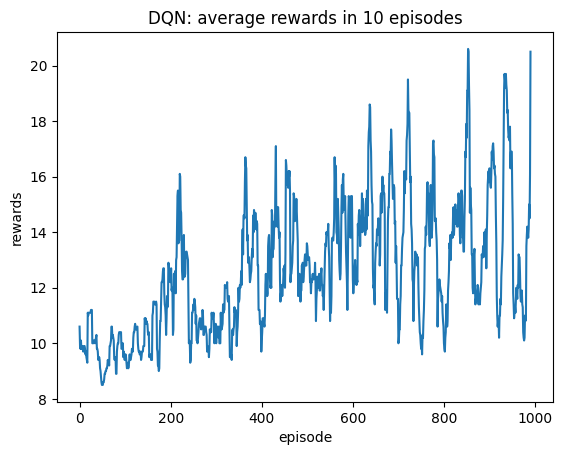

In [ ]:
# Hyperparameters
num_episode = 1000  # Number of training episodes
memory_size = 50000  # Replay buffer size
initial_memory_size = 500  # Number of initial random transitions to collect
target_update_freq = 10  # Frequency to update the target network

# Logs
episode_rewards = []
num_average_epidodes = 10

env = gym.make('CartPole-v0')
max_steps = env.spec.max_episode_steps  # Max steps per episode

agent = Dqn(env.observation_space.shape[0], env.action_space.n, memory_size=memory_size, target_update_freq=target_update_freq)

# Populate the replay buffer with random actions first
state = env.reset()
for step in range(initial_memory_size):
    action = env.action_space.sample() # Sample a random action
    next_state, reward, done, _ = env.step(action)
    transition = {
        'state': state,
        'next_state': next_state,
        'reward': reward,
        'action': action,
        'done': int(done)
    }
    agent.replay_buffer.append(transition)
    state = env.reset() if done else next_state

for episode in range(num_episode):
    state = env.reset()  # The environment returns a 4D continuous observation
    episode_reward = 0
    for t in range(max_steps):
        action = agent.get_action(state, episode)  # Select an action
        next_state, reward, done, _ = env.step(action)
        episode_reward += reward
        transition = {
            'state': state,
            'next_state': next_state,
            'reward': reward,
            'action': action,
            'done': int(done)
        }
        agent.replay_buffer.append(transition)
        agent.update_q()  # Update the Q-function
        state = next_state
        if done:
            break
    episode_rewards.append(episode_reward)
    if episode % 20 == 0:
        print("Episode %d finished | Episode reward %f" % (episode, episode_reward))

# Plot the moving average of cumulative reward
moving_average = np.convolve(episode_rewards, np.ones(num_average_epidodes)/num_average_epidodes, mode='valid')
plt.plot(np.arange(len(moving_average)),moving_average)
plt.title('DQN: average rewards in %d episodes' % num_average_epidodes)
plt.xlabel('episode')
plt.ylabel('rewards')
plt.show()

env.close()

/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for

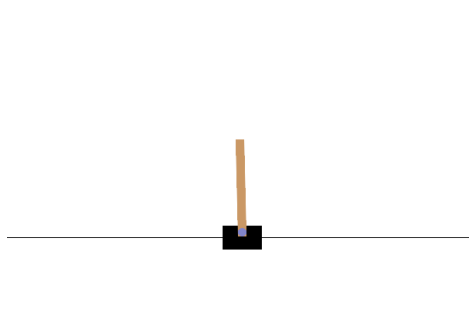

In [ ]:
# Test the final policy (visualisation)
env = gym.make('CartPole-v0')
frames = []
for episode in range(5):
    state = env.reset()
    frames.append(env.render(mode='rgb_array'))
    done = False
    while not done:
        action = agent.get_greedy_action(state)
        state, reward, done, _ = env.step(action)
        frames.append(env.render(mode='rgb_array'))
env.close()

plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(anim.to_jshtml())

**やってみよう！（余力のある人向けの追加課題）**

ハイパーパラメータを変化させた場合，学習曲線がどのように変化するかを観察してみましょう．

- 価値関数の表現器として用いたニューラルネットワーク（`QNetwork`）の構造（層の数や中間層のユニットの数）を変更するとどうなるでしょうか．

- リプレイバッファの大きさ（`memory_size`）を変えるとどうなるでしょうか．

---

**Try it! (Optional extra task for those with time)**

Change hyperparameters and observe how the learning curve changes.

- What happens if you change the architecture of the neural network used as the value-function approximator (`QNetwork`) (e.g., number of layers or hidden units)?
- What happens if you change the replay buffer size (`memory_size`)?


In [ ]:
# LET'S TRY

## 4.方策勾配法

方策をニューラルネットワークで表現しましょう．$\pi_{\theta}(\cdot)$とします．
方策勾配法では，期待収益の最大化
$$\max_{\theta}\mathbb{E^{\pi_{\theta}}}\left[R\right]$$
を勾配上昇法で実現します．

$$\theta \leftarrow \theta+\alpha\nabla_{\theta}{\mathbb{E^{\pi_{\theta}}}}\left[R\right]$$

方策勾配定理（スライド参照）により，方策勾配は次の式で計算できます：
$$
\nabla_\theta \mathbb{E}^{\pi_\theta}[R] = \mathbb{E}^{\pi_\theta}\left[\sum_{h=0}^\infty \gamma^h \nabla_\theta \log\pi_\theta(a^{(h)}\mid s^{(h)}) Q^{\pi_\theta}(s^{(h)}, a^{(h)})\right]
$$

---

## 4. Policy Gradient Methods

Let’s represent the policy with a neural network, denoted by $\pi_{\theta}(\cdot)$.
Policy gradient methods maximise the expected return
$$\max_{\theta}\mathbb{E^{\pi_{\theta}}}\left[R\right]$$
using gradient ascent:

$$\theta \leftarrow \theta+\alpha\nabla_{\theta}{\mathbb{E^{\pi_{\theta}}}}\left[R\right]$$

By the policy gradient theorem (see the slides), the policy gradient can be computed as:
$$
\nabla_\theta \mathbb{E}^{\pi_\theta}[R] = \mathbb{E}^{\pi_\theta}\left[\sum_{h=0}^\infty \gamma^h \nabla_\theta \log\pi_\theta(a^{(h)}\mid s^{(h)}) Q^{\pi_\theta}(s^{(h)}, a^{(h)})\right]
$$


### 4.1.REINFORCEアルゴリズム

**Q値のモンテカルロ近似**

方策勾配法を計算するためには$Q^{\pi_\theta}$を計算しなければいけません．
REINFORCEは定義に従って$Q^{\pi_\theta}$をモンテカルロ近似します．収益のモンテカルロ近似では，無限ホライゾンの場合，本来は無限長のサンプル系列が必要になります．しかし，割引のおかげで有限長の系列で近似しても問題ありません（スライド参照）．
$H$ステップ長の系列で近似する場合を考えましょう：

$$
Q^{\pi_\theta}(s^{h}, a^{h}) \approx r^{h}+ \gamma r^{h+1} + \gamma^2 r^{h+2} + \cdots +\gamma^{H} r^{h+H}
$$

実装の際にはそもそもデータ系列が$H$ステップより短い場合があります（例えばCartPoleが10ステップ目で倒れてしまった場合を想像してください）．
そこで，以下の実装では$H$を可能な限り長めに取っています．

**方策ネットワークについて**

今回はCartPoleでテストするので，離散の行動空間です．
方策の関数表現の仕方は設計者次第ですが，今回は[PyTorchのCategorical](https://pytorch.org/docs/stable/distributions.html#categorical)に従ってサンプルするようにしましょう．また，テスト時には，出力された確率値が最大の行動を選びます（貪欲方策）．テスト時の評価方法も設計者次第です．

---

### 4.1. REINFORCE

**Monte Carlo approximation of the Q-value**

To compute the policy gradient, we need $Q^{\pi_\theta}$.
REINFORCE approximates $Q^{\pi_\theta}$ by Monte Carlo estimation, following its definition. For an infinite-horizon problem, a truly infinite trajectory would be required, but thanks to discounting, a finite-length trajectory is sufficient in practice (see the slides).
Consider approximating with a trajectory of length $H$:

$$
Q^{\pi_\theta}(s^{h}, a^{h}) \approx r^{h}+ \gamma r^{h+1} + \gamma^2 r^{h+2} + \cdots +\gamma^{H} r^{h+H}
$$

In practice, the trajectory can be shorter than $H$ (e.g., CartPole may fall at step 10).
Therefore, in the implementation below we choose $H$ as large as possible.

**About the policy network**

Since we test on CartPole, the action space is discrete.
There are many possible designs, but here we sample actions according to [PyTorch’s `Categorical`](https://pytorch.org/docs/stable/distributions.html#categorical). During testing, we choose the action with the highest output probability (a greedy policy). The evaluation rule during testing is also a design choice.


In [ ]:
# Define the policy network
class PolicyNetwork(nn.Module):
    def __init__(self, num_state, num_action, hidden_size=16):
        super(PolicyNetwork, self).__init__()
        self.fc1 = nn.Linear(num_state, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, num_action)

    def forward(self, x):
        h = F.elu(self.fc1(x))
        h = F.elu(self.fc2(h))
        action_prob = F.softmax(self.fc3(h), dim=-1)
        return action_prob

In [ ]:
class Reinforce:
    def __init__(self, num_state, num_action, gamma=0.99, lr=0.001):
        self.num_state = num_state
        self.gamma = gamma  # Discount factor
        self.pinet = PolicyNetwork(num_state, num_action)
        self.optimizer = optim.Adam(self.pinet.parameters(), lr=lr)
        self.memory = []  # Store (reward, action selection probability) tuples in a list

    # Update the policy
    def update_policy(self):
        H = len(self.memory)  # Episode length
        R = 0
        loss = 0
        # Compute returns for each step by iterating backward through the episode
        for h, (r, prob) in enumerate(self.memory[::-1]):
            R = r + self.gamma * R
            loss -= self.gamma ** (H-1-h) * torch.log(prob) * R
        loss = loss/len(self.memory) # WRITE ME
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    # Choose the action with the highest softmax probability
    def get_greedy_action(self, state):
        state_tensor = torch.tensor(state, dtype=torch.float).view(-1, self.num_state)
        action_prob = self.pinet(state_tensor.data).squeeze()
        action = torch.argmax(action_prob.data).item()
        return action

    # Sample an action from a categorical distribution
    def get_action(self, state):
        state_tensor = torch.tensor(state, dtype=torch.float).view(-1, self.num_state)
        action_prob = self.pinet(state_tensor.data).squeeze()
        action = Categorical(action_prob).sample().item()
        return action, action_prob[action]

    def add_memory(self, r, prob):
        self.memory.append((r, prob))

    def reset_memory(self):
        self.memory = []

/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Episode 0 finished | Episode reward 15.000000
Episode 20 finished | Episode reward 12.000000
Episode 40 finished | Episode reward 49.000000
Episode 60 finished | Episode reward 29.000000
Episode 80 finished | Episode reward 42.000000
Episode 100 finished | Episode reward 26.000000
Episode 120 finished | Episode reward 20.000000
Episode 140 finished | Episode reward 14.000000
Episode 160 finished | Episode reward 14.000000
Episode 180 finished | Episode reward 11.000000
Episode 200 finished | Episode reward 19.000000
Episode 220 finished | Episode reward 22.000000
Episode 240 finished | Episode reward 26.000000
Episode 260 finished | Episode reward 15.000000
Episode 280 finished | Episode reward 24.000000
Episode 300 finished | Episode reward 23.000000
Episode 320 finished | Episode reward 17.000000
Episode 340 finished | Episode reward 11.000000
Episode 360 finished | Episode reward 21.000000
Episode 380 finished | Episode reward 12.000000
Episode 400 finished | Episode reward 27.00000

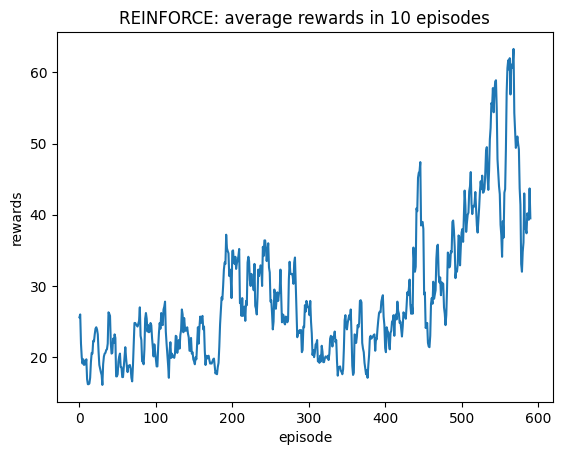

In [ ]:
# Hyperparameters
num_episode = 600  # Number of training episodes

# Logs
episode_rewards = []
num_average_epidodes = 10

env = gym.make('CartPole-v0')
max_steps = env.spec.max_episode_steps  # Max steps per episode

agent = Reinforce(env.observation_space.shape[0], env.action_space.n)

for episode in range(num_episode):
    state = env.reset()  # The environment returns a 4D continuous observation
    episode_reward = 0
    for t in range(max_steps):
        action, prob = agent.get_action(state)  # Select an action
        next_state, reward, done, _ = env.step(action)
        episode_reward += reward
        agent.add_memory(reward, prob)
        state = next_state
        if done:
            agent.update_policy()
            agent.reset_memory()
            break
    episode_rewards.append(episode_reward)
    if episode % 20 == 0:
        print("Episode %d finished | Episode reward %f" % (episode, episode_reward))

# Plot the moving average of cumulative reward
moving_average = np.convolve(episode_rewards, np.ones(num_average_epidodes)/num_average_epidodes, mode='valid')
plt.plot(np.arange(len(moving_average)),moving_average)
plt.title('REINFORCE: average rewards in %d episodes' % num_average_epidodes)
plt.xlabel('episode')
plt.ylabel('rewards')
plt.show()

env.close()

### 4.2.Actor-Critic法とDDPG

講義で見たように，$Q^{\pi_\theta}$の推定方法はモンテカルロ近似だけではありません．DQNのように，動的計画法ベースの手法を考えることができます．
そこで，今回は方策（actor）と価値関数（critic）の両方をニューラルネットワークで表現した手法を実装してみましょう．
このようなアルゴリズムをActor-Critic法といいます．

今回は特に，連続な行動空間を持つ問題にActor-Critic法を利用してみましょう．

---

### 4.2. Actor–Critic and DDPG

As you saw in the lecture, Monte Carlo estimation is not the only way to estimate $Q^{\pi_\theta}$. We can also consider dynamic-programming-based methods like DQN.
So here, we will implement a method that represents both the policy (actor) and the value function (critic) with neural networks.
Such algorithms are called *actor–critic* methods.

In particular, we will apply an actor–critic method to a problem with a **continuous** action space.


**連続行動空間の環境の例：pendulum-v1**

OpenAI Gymには，連続行動空間の環境のシミュレータも含まれています．
ここでは`pendulum-v1`という，軸の角速度を制御して振子を立てる問題を解いてみましょう（[詳細](https://github.com/openai/gym/wiki/Pendulum-v1)）．

- 状態空間：3つの連続値
    1. $\cos(\theta)$：振子の向き$\theta$のcos $[-1.0,1.0]$
    2. $\sin(\theta)$：振子の向き$\theta$のsin $[-1.0,1.0]$
    3. $\dot{\theta}$：振子の角速度 $[-8.0,8.0]$
- 行動空間：1つの連続値．
  - $a$：関節（中心）にかける力 $[-2.0,2.0]$
- エピソードの長さが200ステップに達したときにエピソードが終了します．
- 報酬：終端条件に達するまで常に$-(\theta^2 + 0.1\times\dot{\theta}^2 + 0.001\times a^2)$
    
環境を作成してランダムな行動を取ってみましょう．

---

**Example of a continuous-action environment: `pendulum-v1`**

OpenAI Gym also includes simulators with continuous action spaces.
Here we will solve `pendulum-v1`, a task where you control the angular velocity to balance a pendulum upright ([details](https://github.com/openai/gym/wiki/Pendulum-v1)).

- State space: 3 continuous values
    1. $\cos(\theta)$: cosine of the pendulum angle $\theta$ in $[-1.0, 1.0]$
    2. $\sin(\theta)$: sine of the pendulum angle $\theta$ in $[-1.0, 1.0]$
    3. $\dot{\theta}$: angular velocity in $[-8.0, 8.0]$
- Action space: 1 continuous value
  - $a$: torque applied at the joint (centre) in $[-2.0, 2.0]$
- The episode ends when the length reaches 200 steps.
- Reward: always $-(\theta^2 + 0.1\times\dot{\theta}^2 + 0.001\times a^2)$ until termination

Let’s create the environment and take random actions.


/usr/local/lib/python3.12/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


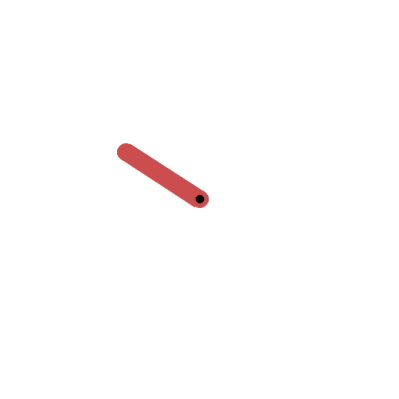

In [ ]:
env = gym.make('Pendulum-v1')  # Create the simulator environment
frames = []
for episode in range(3):
    state = env.reset()  # Start an episode (reset the environment)
    frames.append(env.render(mode='rgb_array'))
    done = False
    while not done:
        action = env.action_space.sample()  # Sample a random action
        next_state, reward, done, _ = env.step(action)  # Take the action and get next state, reward, and done flag
        frames.append(env.render(mode='rgb_array'))
env.close()  # Close the rendering

# Check the result
plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(anim.to_jshtml())

**Deep Deterministic Policy Gradient (DDPG)**

方策勾配法は自然な形で連続な行動空間に対応することができます．（別にActor-Critic法に限らず，REINFORCEでもできます．）

古典的には，REINFORCEで出力層に仮定した分布をカテゴリカル分布から正規分布（ガウス分布）に変更することで，連続値を出力する実装がよく利用されてきました．

近年では，[DDPG](https://arxiv.org/abs/1509.02971)（Deep Deterministic Policy Gradient）や，[SAC](https://arxiv.org/abs/1801.01290)（Soft Actor-Critc）と呼ばれる手法が用いられることが多いです．

DDPG（Deep Deterministic Policy Gradient）は，actor（方策）とcritic（行動価値関数）の両方をニューラルネットワークで表現した手法です．

全体として，**連続値の行動空間に対してDQNを用いた手法**になっています．
- 連続値の行動空間に対して$\arg\max_{a'}Q_{\phi}(s_{t},a')$を求めるのは難しいので，方策もNNでパラメータ化することで解決しています．
- どうせ方策は貪欲方策を取る場合，方策を分布として定義するのではなく，$S$から$A$へのmappingを方策として考えても良いです．つまり，今回は$\pi_\theta: S \to A$を方策として考えます．

criticの目標は$Q^{\pi_\theta}$の学習です．これはDQNと似た形式の
$$ \text{ベルマン誤差} = r^{(h+1)} + \gamma Q_{\phi}(s^{(h+1)}, \pi_{\theta}(s^{(h+1)})) - Q_{\phi}(s^{(h)}, a^{(h)}) $$
の最小化をすることで達成します（講義最後の方でやりました）．

actorの更新は方策勾配定理よりも，どちらかといえば，価値反復法を意識した更新方法を採用しています．actorはQ関数$Q_{\phi}\left(s, \pi_{\theta}(s)\right)$の値が最**大**になるように学習します．つまり，actorの勾配は$$\nabla_{\theta} Q_{\phi}\left(s, \pi_{\theta}(s)\right)$$を使って更新します．

実装では，これらのcriticとactorの更新を交互に繰り返して最適化を行います．


**論文**
- [Continuous control with deep reinforcement learning](https://arxiv.org/abs/1509.02971)

---

**Deep Deterministic Policy Gradient (DDPG)**

Policy gradient methods naturally extend to continuous action spaces (this is true not only for actor–critic methods but also for REINFORCE).

Classically, a common approach was to replace the categorical distribution at the output layer in REINFORCE with a normal (Gaussian) distribution, so that the policy outputs continuous actions.

More recently, methods such as [DDPG](https://arxiv.org/abs/1509.02971) (Deep Deterministic Policy Gradient) and [SAC](https://arxiv.org/abs/1801.01290) (Soft Actor-Critic) are often used.

DDPG represents both the actor (policy) and the critic (action-value function) with neural networks.

Overall, DDPG can be seen as a **DQN-style method for continuous action spaces**.
- In continuous action spaces, it is difficult to compute $\arg\max_{a'}Q_{\phi}(s_{t},a')$, so DDPG parameterises the policy with a neural network to address this.
- If we ultimately use a greedy policy anyway, we do not need to define the policy as a distribution; we can directly model it as a mapping from $S$ to $A$. That is, we consider $\pi_\theta: S \to A$ as the policy.

The critic’s goal is to learn $Q^{\pi_\theta}$. Similar to DQN, this can be done by minimising the Bellman error
$$\text{Bellman error} = r^{(h+1)}+\gamma Q_{\phi}(s^{(h+1)},\pi_{\theta}(s^{(h+1)})) - Q_{\phi}(s^{(h)},a^{(h)})$$
(covered toward the end of the lecture).

The actor update is based less on the policy gradient theorem and more on an update motivated by value iteration. The actor is trained to maximise $Q_{\phi}\left(s, \pi_{\theta}(s)\right)$. In other words, we update the actor using the gradient
$$\nabla_{\theta} Q_{\phi}\left(s, \pi_{\theta}(s)\right).$$

In the implementation, we alternate updates of the critic and the actor.

**Paper**
- [Continuous control with deep reinforcement learning](https://arxiv.org/abs/1509.02971)


In [ ]:
# Actor network
class ActorNetwork(nn.Module):
    def __init__(self, num_state, action_space, hidden_size=16):
        super(ActorNetwork, self).__init__()
        self.action_mean = torch.tensor(0.5*(action_space.high+action_space.low), dtype=torch.float)
        self.action_halfwidth = torch.tensor(0.5*(action_space.high-action_space.low), dtype=torch.float)
        self.fc1 = nn.Linear(num_state, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, action_space.shape[0])

    def forward(self, s):
        h = F.elu(self.fc1(s))
        h = F.elu(self.fc2(h))
        a = self.action_mean + self.action_halfwidth*torch.tanh(self.fc3(h))
        return a

# Critic network (takes state and action and outputs the Q-value)
class CriticNetwork(nn.Module):
    def __init__(self, num_state, action_space, hidden_size=16):
        super(CriticNetwork, self).__init__()
        self.action_mean = torch.tensor(0.5*(action_space.high+action_space.low), dtype=torch.float)
        self.action_halfwidth = torch.tensor(0.5*(action_space.high-action_space.low), dtype=torch.float)
        self.fc1 = nn.Linear(num_state+action_space.shape[0], hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, action_space.shape[0])

    def forward(self, s, a):
        a = (a-self.action_mean)/self.action_halfwidth
        h = F.elu(self.fc1(torch.cat([s,a],1)))
        h = F.elu(self.fc2(h))
        q = self.fc3(h)
        return q

# Define the replay buffer
class ReplayBuffer:
    def __init__(self, memory_size):
        self.memory_size = memory_size
        self.memory = deque([], maxlen = memory_size)

    def append(self, transition):
        self.memory.append(transition)

    def sample(self, batch_size):
        batch_indexes = np.random.randint(0, len(self.memory), size=batch_size)
        states      = np.array([self.memory[index]['state'] for index in batch_indexes])
        next_states = np.array([self.memory[index]['next_state'] for index in batch_indexes])
        rewards     = np.array([self.memory[index]['reward'] for index in batch_indexes])
        actions     = np.array([self.memory[index]['action'] for index in batch_indexes])
        dones   = np.array([self.memory[index]['done'] for index in batch_indexes])
        return {'states': states, 'next_states': next_states, 'rewards': rewards, 'actions': actions, 'dones': dones}

In [ ]:
class Ddpg:
    def __init__(self, observation_space, action_space, gamma=0.99, lr=1e-3, batch_size=32, memory_size=50000, target_update_freq=30):
        self.num_state = observation_space.shape[0]
        self.num_action = action_space.shape[0]
        self.state_mean = 0.5*(observation_space.high + observation_space.low)
        self.state_halfwidth = 0.5*(observation_space.high - observation_space.low)
        self.gamma = gamma  # Discount factor
        self.batch_size = batch_size
        self.actor = ActorNetwork(self.num_state, action_space)
        self.actor_target = copy.deepcopy(self.actor)  # Target actor network
        self.actor_optimizer = optim.Adam(self.actor.parameters(), lr=lr)
        self.critic = CriticNetwork(self.num_state, action_space)
        self.critic_target = copy.deepcopy(self.critic)  # Target critic network
        self.critic_optimizer = optim.Adam(self.critic.parameters(), lr=lr)
        self.replay_buffer = ReplayBuffer(memory_size)
        self.target_update_freq = target_update_freq  # Frequency to update the target network
        self._target_update_count = 0

    # Normalise continuous states to the range [-1, 1]
    def normalize_state(self, state):
        state = (state-self.state_mean)/self.state_halfwidth
        return state

    # Convert the minibatch sampled from the replay buffer to tensors
    def batch_to_tensor(self, batch):
        states = torch.tensor([self.normalize_state(s) for s in batch["states"]], dtype=torch.float)
        actions = torch.tensor(batch["actions"], dtype=torch.float)
        next_states = torch.tensor([self.normalize_state(s) for s in batch["next_states"]], dtype=torch.float)
        rewards = torch.tensor(batch["rewards"], dtype=torch.float)
        return states, actions, next_states, rewards

    # Update actor and critic
    def update(self):
        batch = self.replay_buffer.sample(self.batch_size)
        states, actions, next_states, rewards = self.batch_to_tensor(batch)

        # Update the critic
        target_q = (rewards + self.gamma*self.critic_target(next_states, self.actor_target(next_states)).squeeze()).data # WRITE ME
        q = self.critic(states, actions).squeeze()
        critic_loss = F.mse_loss(q, target_q)
        self.critic_optimizer.zero_grad()
        critic_loss.backward()
        self.critic_optimizer.step()

        # Update the actor
        actor_loss = -self.critic(states, self.actor(states)).mean()
        self.actor_optimizer.zero_grad()
        actor_loss.backward()
        self.actor_optimizer.step()

        # Update the target network parameters
        self._target_update_count += 1
        if self._target_update_count % self.target_update_freq == 0:  # Update the target network every fixed number of updates
          self.critic_target.load_state_dict(self.critic.state_dict())

    # Choose the action with the maximum Q-value
    def get_action(self, state):
        state_tensor = torch.tensor(self.normalize_state(state), dtype=torch.float).view(-1, self.num_state)
        action = self.actor(state_tensor).view(self.num_action)
        return action

/usr/local/lib/python3.12/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.12/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/tmp/ipykernel_446/447971132.py:26: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)
  states = torch.tensor([self.normalize_state(s) for s in batch["states"]], dtype=torch.float)


1000 Data collected
Episode 0 finished | Episode reward -1377.789388
Episode 20 finished | Episode reward -1866.068479
Episode 40 finished | Episode reward -1428.889137
Episode 60 finished | Episode reward -1510.551335
Episode 80 finished | Episode reward -2.262709
Episode 100 finished | Episode reward -623.062246
Episode 120 finished | Episode reward -1098.515473
Episode 140 finished | Episode reward -958.563855
Episode 160 finished | Episode reward -9.121864
Episode 180 finished | Episode reward -499.327695
Episode 200 finished | Episode reward -245.180148
Episode 220 finished | Episode reward -463.403342
Episode 240 finished | Episode reward -126.987968


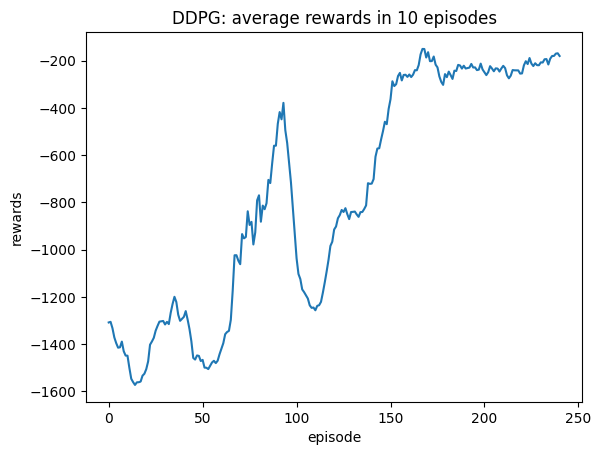

In [ ]:
# Hyperparameters
num_episode = 250  # Number of training episodes (kept small because training is slow)
memory_size = 50000  # Replay buffer size
initial_memory_size = 1000  # Number of initial random transitions to collect
target_update_freq = 30  # Frequency to update the critic target network
# Logging settings
episode_rewards = []
num_average_epidodes = 10

env = gym.make('Pendulum-v1')
max_steps = env.spec.max_episode_steps  # Max steps per episode
agent = Ddpg(env.observation_space, env.action_space, memory_size=memory_size, target_update_freq=target_update_freq)

# Populate the replay buffer with random actions first
state = env.reset()
for step in range(initial_memory_size):
    action = env.action_space.sample() # Sample a random action
    next_state, reward, done, _ = env.step(action)
    transition = {
        'state': state,
        'next_state': next_state,
        'reward': reward,
        'action': action,
        'done': int(done)
    }
    agent.replay_buffer.append(transition)
    state = env.reset() if done else next_state
print('%d Data collected' % (initial_memory_size))

for episode in range(num_episode):
    state = env.reset()  # The environment returns a 3D continuous observation
    episode_reward = 0
    for t in range(max_steps):
        action = agent.get_action(state).data.numpy()  # Select an action
        next_state, reward, done, _ = env.step(action)
        episode_reward += reward
        transition = {
            'state': state,
            'next_state': next_state,
            'reward': reward,
            'action': action,
            'done': int(done)
        }
        agent.replay_buffer.append(transition)
        agent.update()  # Update actor and critic
        state = next_state
        if done:
            break
    episode_rewards.append(episode_reward)
    if episode % 20 == 0:
        print("Episode %d finished | Episode reward %f" % (episode, episode_reward))

# Plot the moving average of cumulative reward
moving_average = np.convolve(episode_rewards, np.ones(num_average_epidodes)/num_average_epidodes, mode='valid')
plt.plot(np.arange(len(moving_average)),moving_average)
plt.title('DDPG: average rewards in %d episodes' % num_average_epidodes)
plt.xlabel('episode')
plt.ylabel('rewards')
plt.show()

env.close()

/usr/local/lib/python3.12/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


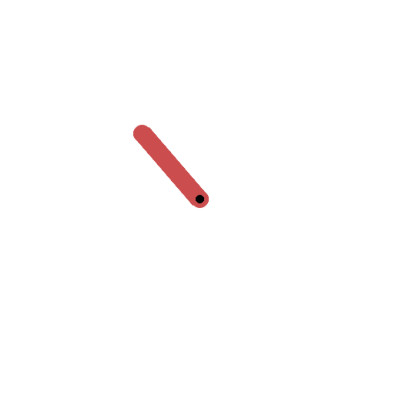

In [ ]:
# Test the final policy (visualisation)
env = gym.make('Pendulum-v1')
max_steps = env.spec.max_episode_steps  # Max steps per episode
frames = []
for episode in range(3):
    state = env.reset()
    frames.append(env.render(mode='rgb_array'))
    for t in range(max_steps):
        action = agent.get_action(state).detach().numpy()
        state, reward, terminal, _ = env.step(action)
        frames.append(env.render(mode='rgb_array'))
env.close()

plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate(i):
    patch.set_data(frames[i])

anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(anim.to_jshtml())

In [ ]:
class QLearning:
    def __init__(self, num_state, num_action, num_discretize, gamma=0.99, alpha=0.5):
        self.num_action = num_action
        self.gamma = gamma  # Discount factor
        self.alpha = alpha  # Learning rate
        # Create the Q-table
        self.qtable = np.zeros((num_discretize**num_state, num_action))

    # Update the Q-table
    def update_qtable(self, state, action, reward, next_state):
        self.qtable[state, action] = (1 - self.alpha) *  self.qtable[state, action] + self.alpha* (reward + self.gamma * self.qtable[next_state].max())

    # Choose the action with the maximum Q-value (greedy policy)
    def get_greedy_action(self, state):
        action = np.argmax(self.qtable[state])
        return action

    # ε-greedy policy
    def get_action(self, state, episode):
        epsilon = 0.7 * (1/(episode+1))  # Here we use a decaying ε (starts around 0.7)
        if epsilon <= np.random.uniform(0,1):
            action = self.get_greedy_action(state)
        else:
            action = np.random.choice(self.num_action)
        return action

**やってみよう！（余力のある人向けの追加課題）**
1. ハイパーパラメータ・ネットワークを変更した場合，学習曲線がどのように変化するかを観察してみましょう．
1. `pendulum-v1`以外の連続値行動空間のタスクを解いてみましょう．
  - OpenAI Gymで利用できる環境の一覧は，[webサイト](https://gym.openai.com/envs/)や[Github wiki](https://github.com/openai/gym/wiki/Table-of-environments)に掲載されています．
  - おすすめの環境
    - `MountainCarContinuous-v0`：車を山の頂上に到達させるタスク．入力の次元も小さく（2次元）で比較的簡単．
    - 以下の環境は，`box2d`と`gym[Box2D]`を追加でインストールする必要があります（notebook上では`!pip install box2d gym[Box2D]`で入ります）．
      - `LunarLanderContinuous-v2`：宇宙船を指定された位置に着陸させるタスク．
      - `BipedalWalker-v3`：2足歩行ロボットを歩かせるタスク．入力次元が24次元で少し難しい．
      - `BipedalWalkerHardcore-v3`：上記環境をもっと難しくしたタスク（障害物がある）．
1. 今回の講義で紹介されたもの以外の連続値行動空間の深層強化学習手法を調べて実装してみましょう．既存の手法の課題として何が挙げられていて，それに対してどのような工夫がなされているでしょうか．
  - 近年の代表的な手法の例
    - [TRPO（Trust Region Policy Optimization）](https://arxiv.org/abs/1502.05477)
    - [PPO（Proximal Policy Optimization）](https://arxiv.org/abs/1707.06347)
    - [SAC（Soft Actor-Critic）](https://arxiv.org/abs/1801.01290)
    - [TD3（Twin-Delayed DDPG）](https://arxiv.org/abs/1802.09477)

---

**Try it! (Optional extra task for those with time)**

1. Change hyperparameters / network architectures and observe how the learning curve changes.
1. Try solving a continuous-action task other than `pendulum-v1`.
  - A list of environments available in OpenAI Gym is on the [website](https://gym.openai.com/envs/) and the [GitHub wiki](https://github.com/openai/gym/wiki/Table-of-environments).
  - Recommended environments:
    - `MountainCarContinuous-v0`: drive a car to the top of a hill. The input dimension is small (2D) and it is relatively easy.
    - The following environments require installing `box2d` and `gym[Box2D]` (in a notebook you can run `!pip install box2d gym[Box2D]`):
      - `LunarLanderContinuous-v2`: land a spacecraft at a specified location.
      - `BipedalWalker-v3`: make a bipedal robot walk. The input dimension is 24, making it a bit harder.
      - `BipedalWalkerHardcore-v3`: a harder version of the above (with obstacles).
1. Investigate and implement a deep RL method for continuous action spaces that was not introduced in this lecture. What limitations of existing methods are discussed, and what ideas are proposed to address them?
  - Examples of representative recent methods:
    - [TRPO (Trust Region Policy Optimization)](https://arxiv.org/abs/1502.05477)
    - [PPO (Proximal Policy Optimization)](https://arxiv.org/abs/1707.06347)
    - [SAC (Soft Actor-Critic)](https://arxiv.org/abs/1801.01290)
    - [TD3 (Twin-Delayed DDPG)](https://arxiv.org/abs/1802.09477)
